# Analyze a video

The functions avaliabe in this notebook allow you to quickly analyze the performance of hrnet and wrnch vs the ground truth


#### To prep a video for analysis:
1. Process the video with TuMeke_Testing_Framework.ipynb to store the pickled hrnet joints
2. Process the video on FS instance to get pickled Posenet joints.
3. Upload Posenet joints to work_dirs/tumeke_testing/posenet_pickle_files
4. Upload the image files in - work_dirs/tumeke_testing/ground_truth_images
5. Upload the full annotation file from label studio to - work_dirs/tumeke_testing/ground_truth_labels
6. Upload the wrnch .json file to - work_dirs/tumeke_testing/wrnch_jsons

<b>Important note</b>:
- Make sure the files in everything above have the same base name (e.g. test.json, test.p), except ground truth labels. Ground truth labels must have whatever names was used in label studio.

#### To format the raw data for analysis,  you have the following functions:
1. <b>get_hrnet_wrnch_dfs</b>: Formats Hrnet and Wrnch data into a dataframe index by frame for easy analysis
2. <b>get_gt_df</b>: Formats ground truth data  into a dataframe index by frame for easy analysis

#### To analyze the videos, you have the following functions:
1. <b>visualize_df_scores</b>: Visualize the scores of the hrnet data frame
2. <b>visualize_overlap</b>: Visualize a specific frame and the keypoints from Ground Truth, Hrnet, and Wrnch
3. <b>pck_calc</b>: Output summary stats on PCK (Percentage Correct Keypoints) for Ground Truth, Hrnet, and Wrnch
4. <b>pcp_calc</b>: Output summary stats on PCP (Percentage Correct Parts) for Ground Truth, Hrnet, and Wrnch
5. <b>smoothness_calc</b>: Output summary stats on smoothness between frames for each joint

In [11]:
from tumeke_testing_modules.load_model_data import get_hrnet_posenet_wrnch_dfs
from tumeke_testing_modules.load_gt_data import get_gt_df
from tumeke_testing_modules.visualize_frame import visualize_overlap, get_size
from tumeke_testing_modules.pck_calc import pck_calc, get_ed_by_frame, extract_j_pos, get_torso_diameter
from tumeke_testing_modules.pcp_calc import pcp_calc
from tumeke_testing_modules.visualize_df_scores import visualize_df_scores
from tumeke_testing_modules.smoothness_calc import smoothness_calc

### Load Data

In [32]:
# file = 'AFG_subject_switching_close_nurses_subjects1_partial'
file = 'MERCER_box_slamming1'

# MAKE SURE YOU UPDATE THIS WHEN CHANGING VIDEOS!
multiple_subjects = False
gt_df = get_gt_df(file, multiple_subjects)
shape = get_size(gt_df, file)
height, width = shape[:2]
print(height, width)
hrnet_df, posenet_df, openpose_df, wrnch_df = get_hrnet_posenet_wrnch_dfs(file, width, height)


ground truth loaded and formatted
gt_df shape: (877, 54)
720 480
hrnet data loaded
wrnch data loaded
hrnet data formatted
hrnet_df shape: (2494, 76)
posenet data formatted
posenet_df shape: (2494, 76)
wrnch data formatted
wrnch_df shape: (2494, 76)
openpose data formatted
openpose_df shape: (2494, 76)


### Analyze

In [ ]:
visualize_df_scores(hrnet_df)

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


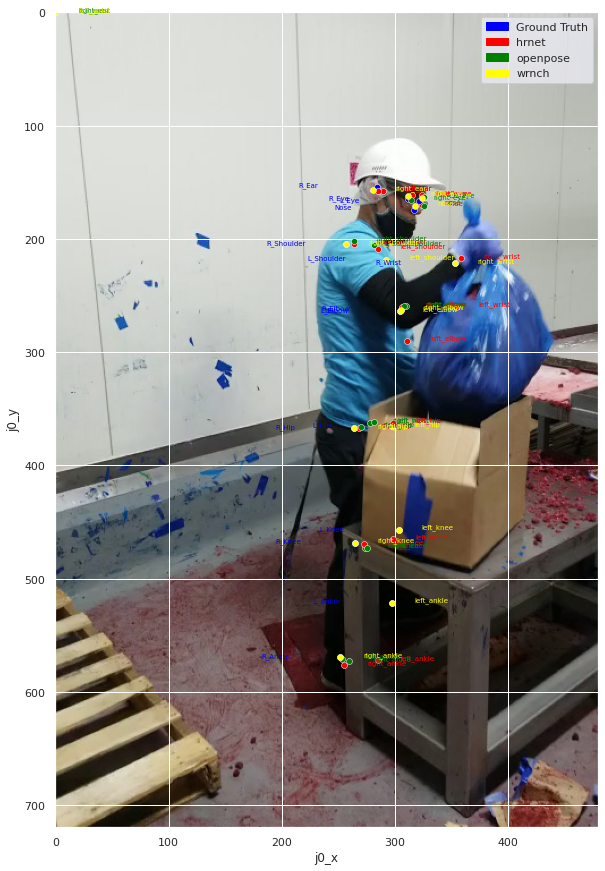

In [33]:
visualize_overlap(gt_df, [hrnet_df, openpose_df, wrnch_df], ["hrnet", "openpose", "wrnch"], 600)


PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 89.62%
hrnet | PCK - Total (all frames): 73.25%
hrnet | PCK - Total (detected frames): 81.18%
hrnet | PCK - By Body part (all frames):
Nose_ed          73.888255
L_Eye_ed         37.172178
R_Eye_ed         68.415051
L_Ear_ed         27.366021
R_Ear_ed         75.940707
L_Shoulder_ed    70.239453
R_S

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 89.17%
posenet | PCK - Total (all frames): 75.55%
posenet | PCK - Total (detected frames): 84.73%
posenet | PCK - By Body part (all frames):
Nose_ed          73.204105
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    69.213227
R_Shoulder_ed    85.062714
L_Elbow_ed       59.293044
R_Elbow_ed       77.651083
L_Wrist_ed       62.485747
R_Wrist_ed       74.572406
L_Hip_ed         84.492588
R_Hip_ed         85.632839
L_Knee_ed        84.150513
R_Knee_ed        81.755986
L_Ankle_ed       71.037628
R_Ankle_ed       73.660205
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          82.097187
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    77.621483
R_Shoulder_ed    95.396419
L_Elbow_ed       66.496164
R_Elbow_ed       87.084399
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
openpose_df
----------


/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


openpose_df | % Detected frames: 74.80%
openpose_df | PCK - Total (all frames): 64.21%
openpose_df | PCK - Total (detected frames): 76.80%
openpose_df | PCK - By Body part (all frames):
Nose_ed          70.647482
L_Eye_ed         67.906977
R_Eye_ed         75.294118
L_Ear_ed         60.655738
R_Ear_ed          0.000000
L_Shoulder_ed    70.437018
R_Shoulder_ed    66.748166
L_Elbow_ed       67.857143
R_Elbow_ed       70.340136
L_Wrist_ed       65.426357
R_Wrist_ed        0.903226
L_Hip_ed         71.204188
R_Hip_ed         70.642202
L_Knee_ed        79.733728
R_Knee_ed        80.305344
L_Ankle_ed       82.910321
R_Ankle_ed       88.034188
dtype: float64
openpose_df | PCK - By Body part (detected frames):
Nose_ed          87.366548
L_Eye_ed         86.135693
R_Eye_ed         87.671233
L_Ear_ed         82.222222
R_Ear_ed          0.000000
L_Shoulder_ed    84.829721
R_Shoulder_ed    86.255924
L_Elbow_ed       80.140598
R_Elbow_ed       88.984509
L_Wrist_ed       76.173285
R_Wrist_ed        

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


wrnch | % Detected frames: 87.46%
wrnch | PCK - Total (all frames): 79.79%
wrnch | PCK - Total (detected frames): 89.81%
wrnch | PCK - By Body part (all frames):
Nose_ed          77.908497
L_Eye_ed         74.634146
R_Eye_ed         85.335413
L_Ear_ed         70.876289
R_Ear_ed         85.000000
L_Shoulder_ed    73.333333
R_Shoulder_ed    77.829099
L_Elbow_ed       73.783784
R_Elbow_ed       81.014304
L_Wrist_ed       72.791024
R_Wrist_ed       81.157470
L_Hip_ed         78.637413
R_Hip_ed         77.880184
L_Knee_ed        84.528302
R_Knee_ed        83.100381
L_Ankle_ed       84.840426
R_Ankle_ed       89.430894
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          89.489489
L_Eye_ed         88.695652
R_Eye_ed         94.310345
L_Ear_ed         87.579618
R_Ear_ed         93.225806
L_Shoulder_ed    82.608696
R_Shoulder_ed    89.035667
L_Elbow_ed       82.852807
R_Elbow_ed       92.023634
L_Wrist_ed       81.861199
R_Wrist_ed       91.225416
L_Hip_ed         89.4

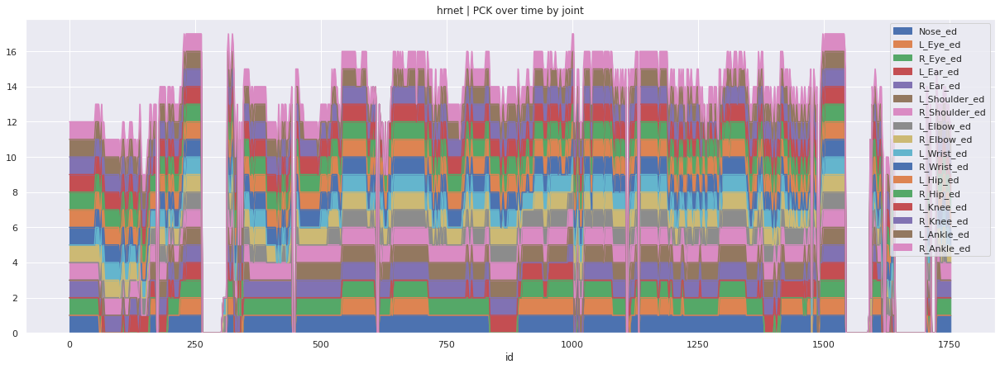

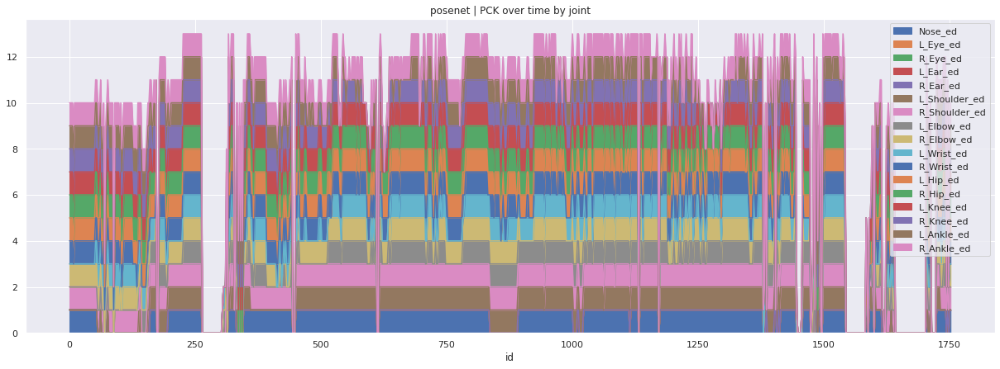

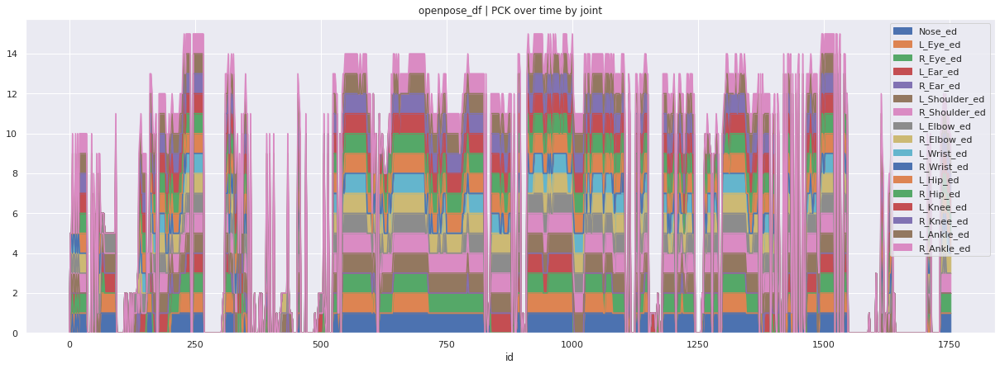

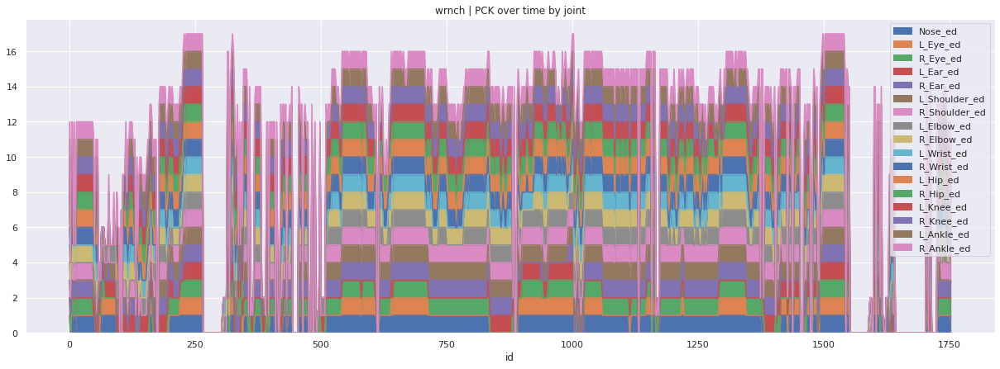

In [34]:
summary = pck_calc(gt_df, [hrnet_df, posenet_df, openpose_df, wrnch_df], ["hrnet", "posenet", "openpose_df", "wrnch"], threshold=.1)

In [ ]:
pcp_calc(gt_df, hrnet_df, wrnch_df)

In [ ]:
smoothness_calc(gt_df, hrnet_df, wrnch_df)

### Aggregate

ground truth loaded and formatted
gt_df shape: (756, 54)
hrnet data loaded
wrnch data loaded
hrnet data formatted
hrnet_df shape: (1513, 76)
posenet data formatted
posenet_df shape: (1513, 76)
wrnch data formatted
wrnch_df shape: (1513, 76)
openpose data formatted
openpose_df shape: (1513, 76)

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 49.60

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

posenet | % Detected frames: 80.03%
posenet | PCK - Total (all frames): 29.79%
posenet | PCK - Total (detected frames): 35.01%
posenet | PCK - By Body part (all frames):
Nose_ed          50.210970
L_Eye_ed          0.140647
R_Eye_ed          0.140647
L_Ear_ed          0.281294
R_Ear_ed          0.281294
L_Shoulder_ed    64.416315
R_Shoulder_ed    62.025316
L_Elbow_ed       71.026723
R_Elbow_ed       61.603376
L_Wrist_ed       50.210970
R_Wrist_ed       40.646976
L_Hip_ed         40.787623
R_Hip_ed         41.350211
L_Knee_ed         8.157525
R_Knee_ed         7.454290
L_Ankle_ed        3.938115
R_Ankle_ed        3.797468
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          59.008264
L_Eye_ed          0.165289
R_Eye_ed          0.165289
L_Ear_ed          0.330579
R_Ear_ed          0.330579
L_Shoulder_ed    75.702479
R_Shoulder_ed    72.892562
L_Elbow_ed       83.471074
R_Elbow_ed       72.396694
L_Wrist_ed       59.008264
R_Wrist_ed       47.768595
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

Nose_ed          66.272189
L_Eye_ed         69.526627
R_Eye_ed         68.343195
L_Ear_ed         69.822485
R_Ear_ed          0.000000
L_Shoulder_ed    78.402367
R_Shoulder_ed    83.727811
L_Elbow_ed       80.177515
R_Elbow_ed       72.781065
L_Wrist_ed       48.224852
R_Wrist_ed        2.662722
L_Hip_ed         46.449704
R_Hip_ed         46.449704
L_Knee_ed         5.621302
R_Knee_ed         6.508876
L_Ankle_ed        1.775148
R_Ankle_ed        0.887574
dtype: float64
openpose | PCK - By Frame:
--------------------
----------
wrnch
----------
wrnch | % Detected frames: 63.36%
wrnch | PCK - Total (all frames): 35.74%
wrnch | PCK - Total (detected frames): 53.05%
wrnch | PCK - By Body part (all frames):
Nose_ed          41.631505
L_Eye_ed         40.928270
R_Eye_ed         36.427567
L_Ear_ed         55.274262
R_Ear_ed         46.272855
L_Shoulder_ed    58.087201
R_Shoulder_ed    56.399437
L_Elbow_ed       51.898734
R_Elbow_ed       45.991561
L_Wrist_ed       37.412096
R_Wrist_ed       3

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

posenet | % Detected frames: 79.50%
posenet | PCK - Total (all frames): 38.89%
posenet | PCK - Total (detected frames): 46.01%
posenet | PCK - By Body part (all frames):
Nose_ed          50.210970
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    64.416315
R_Shoulder_ed    62.025316
L_Elbow_ed       71.026723
R_Elbow_ed       61.603376
L_Wrist_ed       50.210970
R_Wrist_ed       40.646976
L_Hip_ed         40.787623
R_Hip_ed         41.350211
L_Knee_ed         8.157525
R_Knee_ed         7.454290
L_Ankle_ed        3.938115
R_Ankle_ed        3.797468
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          59.400998
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    76.206323
R_Shoulder_ed    73.377704
L_Elbow_ed       84.026622
R_Elbow_ed       72.878536
L_Wrist_ed       59.400998
R_Wrist_ed       48.086522
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


Nose_ed          68.125000
L_Eye_ed         75.907591
R_Eye_ed         73.421927
L_Ear_ed         93.442623
R_Ear_ed          0.000000
L_Shoulder_ed    83.018868
R_Shoulder_ed    84.730539
L_Elbow_ed       86.229508
R_Elbow_ed       84.042553
L_Wrist_ed       59.919028
R_Wrist_ed        2.265372
L_Hip_ed         48.376623
R_Hip_ed         49.190939
L_Knee_ed         6.965174
R_Knee_ed         7.738095
L_Ankle_ed        2.061856
R_Ankle_ed        3.448276
dtype: float64
openpose | PCK - By Frame:
--------------------
----------
wrnch
----------


/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

wrnch | % Detected frames: 63.23%
wrnch | PCK - Total (all frames): 43.41%
wrnch | PCK - Total (detected frames): 62.04%
wrnch | PCK - By Body part (all frames):
Nose_ed          45.230769
L_Eye_ed         47.549020
R_Eye_ed         46.028881
L_Ear_ed         59.442724
R_Ear_ed         64.669421
L_Shoulder_ed    59.084406
R_Shoulder_ed    57.864358
L_Elbow_ed       58.505564
R_Elbow_ed       63.850688
L_Wrist_ed       48.794063
R_Wrist_ed       53.829787
L_Hip_ed         34.477825
R_Hip_ed         35.590778
L_Knee_ed        15.136054
R_Knee_ed         6.297710
L_Ankle_ed       11.555556
R_Ankle_ed        5.504587
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          63.225806
L_Eye_ed         65.688488
R_Eye_ed         64.885496
L_Ear_ed         88.479263
R_Ear_ed         96.604938
L_Shoulder_ed    87.130802
R_Shoulder_ed    84.421053
L_Elbow_ed       79.826464
R_Elbow_ed       82.278481
L_Wrist_ed       63.221154
R_Wrist_ed       67.108753
L_Hip_ed         50.9

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

--------------------
----------
openpose
----------
openpose | % Detected frames: 40.74%
openpose | PCK - Total (all frames): 35.44%
openpose | PCK - Total (detected frames): 71.77%
openpose | PCK - By Body part (all frames):
Nose_ed          52.225519
L_Eye_ed         56.193353
R_Eye_ed         62.931034
L_Ear_ed         44.011976
R_Ear_ed          0.000000
L_Shoulder_ed    46.274510
R_Shoulder_ed    48.015123
L_Elbow_ed       55.555556
R_Elbow_ed       69.140625
L_Wrist_ed       49.206349
R_Wrist_ed        0.947867
L_Hip_ed         26.315789
R_Hip_ed         27.737226
L_Knee_ed         2.347418
R_Knee_ed         1.538462
L_Ankle_ed        0.000000
R_Ankle_ed        0.000000
dtype: float64
openpose | PCK - By Body part (detected frames):
Nose_ed          70.967742
L_Eye_ed         80.172414
R_Eye_ed         75.257732
L_Ear_ed         94.838710
R_Ear_ed          0.000000
L_Shoulder_ed    88.059701
R_Shoulder_ed    89.122807
L_Elbow_ed       90.277778
R_Elbow_ed       90.769231
L_Wrist_

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

wrnch | % Detected frames: 62.96%
wrnch | PCK - Total (all frames): 48.25%
wrnch | PCK - Total (detected frames): 72.20%
wrnch | PCK - By Body part (all frames):
Nose_ed          48.592871
L_Eye_ed         48.054475
R_Eye_ed         48.205128
L_Ear_ed         62.068966
R_Ear_ed         67.957746
L_Shoulder_ed    60.352423
R_Shoulder_ed    59.790732
L_Elbow_ed       63.809524
R_Elbow_ed       67.056075
L_Wrist_ed       57.142857
R_Wrist_ed       63.914373
L_Hip_ed         35.143770
R_Hip_ed         36.423841
L_Knee_ed        14.242424
R_Knee_ed         2.242152
L_Ankle_ed        4.060914
R_Ankle_ed        0.641026
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          65.736041
L_Eye_ed         65.866667
R_Eye_ed         66.197183
L_Ear_ed         90.265487
R_Ear_ed         96.984925
L_Shoulder_ed    88.197425
R_Shoulder_ed    86.206897
L_Elbow_ed       86.563307
R_Elbow_ed       88.307692
L_Wrist_ed       76.119403
R_Wrist_ed       78.277154
L_Hip_ed         52.2

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

--------------------
----------
openpose
----------
openpose | % Detected frames: 36.24%
openpose | PCK - Total (all frames): 40.96%
openpose | PCK - Total (detected frames): 78.72%
openpose | PCK - By Body part (all frames):
Nose_ed          62.037037
L_Eye_ed         63.677130
R_Eye_ed         73.880597
L_Ear_ed         46.376812
R_Ear_ed          0.000000
L_Shoulder_ed    55.670103
R_Shoulder_ed    58.121827
L_Elbow_ed       61.240310
R_Elbow_ed       77.222222
L_Wrist_ed       47.916667
R_Wrist_ed        1.520913
L_Hip_ed         25.833333
R_Hip_ed         27.927928
L_Knee_ed         1.449275
R_Knee_ed         0.847458
L_Ankle_ed        0.000000
R_Ankle_ed        0.000000
dtype: float64
openpose | PCK - By Body part (detected frames):
Nose_ed          75.706215
L_Eye_ed         82.080925
R_Eye_ed         76.744186
L_Ear_ed         94.117647
R_Ear_ed          0.000000
L_Shoulder_ed    92.307692
R_Shoulder_ed    90.513834
L_Elbow_ed       92.397661
R_Elbow_ed       92.052980
L_Wrist_

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


wrnch | % Detected frames: 61.64%
wrnch | PCK - Total (all frames): 51.30%
wrnch | PCK - Total (detected frames): 79.50%
wrnch | PCK - By Body part (all frames):
Nose_ed          48.825065
L_Eye_ed         51.549296
R_Eye_ed         51.452282
L_Ear_ed         64.102564
R_Ear_ed         78.048780
L_Shoulder_ed    64.569536
R_Shoulder_ed    62.056738
L_Elbow_ed       67.191601
R_Elbow_ed       70.029674
L_Wrist_ed       59.842520
R_Wrist_ed       70.297030
L_Hip_ed         35.817308
R_Hip_ed         34.615385
L_Knee_ed        10.659898
R_Knee_ed         0.000000
L_Ankle_ed        1.973684
R_Ankle_ed        0.000000
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          64.705882
L_Eye_ed         68.029740
R_Eye_ed         65.263158
L_Ear_ed         92.592593
R_Ear_ed         97.560976
L_Shoulder_ed    91.121495
R_Shoulder_ed    87.281796
L_Elbow_ed       91.756272
R_Elbow_ed       92.913386
L_Wrist_ed       85.393258
R_Wrist_ed       89.873418
L_Hip_ed         56.4

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

posenet | % Detected frames: 82.27%
posenet | PCK - Total (all frames): 33.80%
posenet | PCK - Total (detected frames): 40.18%
posenet | PCK - By Body part (all frames):
Nose_ed          81.308411
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    81.869159
R_Shoulder_ed    63.177570
L_Elbow_ed       75.700935
R_Elbow_ed       30.467290
L_Wrist_ed       72.523364
R_Wrist_ed       37.196262
L_Hip_ed         54.579439
R_Hip_ed         31.775701
L_Knee_ed         8.411215
R_Knee_ed         6.355140
L_Ankle_ed       29.158879
R_Ankle_ed        2.056075
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          96.666667
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    97.333333
R_Shoulder_ed    75.111111
L_Elbow_ed       90.000000
R_Elbow_ed       36.222222
L_Wrist_ed       86.222222
R_Wrist_ed       44.222222
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

--------------------
----------
wrnch
----------
wrnch | % Detected frames: 89.58%
wrnch | PCK - Total (all frames): 40.49%
wrnch | PCK - Total (detected frames): 44.21%
wrnch | PCK - By Body part (all frames):
Nose_ed          60.560748
L_Eye_ed         46.728972
R_Eye_ed         28.224299
L_Ear_ed         71.401869
R_Ear_ed         16.074766
L_Shoulder_ed    77.009346
R_Shoulder_ed    56.261682
L_Elbow_ed       73.271028
R_Elbow_ed       29.906542
L_Wrist_ed       72.523364
R_Wrist_ed       37.570093
L_Hip_ed         45.981308
R_Hip_ed         26.168224
L_Knee_ed         7.663551
R_Knee_ed         4.672897
L_Ankle_ed       31.588785
R_Ankle_ed        2.803738
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          66.122449
L_Eye_ed         51.020408
R_Eye_ed         30.816327
L_Ear_ed         77.959184
R_Ear_ed         17.551020
L_Shoulder_ed    84.081633
R_Shoulder_ed    61.428571
L_Elbow_ed       80.000000
R_Elbow_ed       32.653061
L_Wrist_ed       79.183673

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWit

hrnet | % Detected frames: 92.69%
hrnet | PCK - Total (all frames): 46.62%
hrnet | PCK - Total (detected frames): 49.16%
hrnet | PCK - By Body part (all frames):
Nose_ed          78.342750
L_Eye_ed         84.141791
R_Eye_ed         24.112150
L_Ear_ed         82.739212
R_Ear_ed         16.415094
L_Shoulder_ed    77.798507
R_Shoulder_ed    61.753731
L_Elbow_ed       74.906367
R_Elbow_ed       31.073446
L_Wrist_ed       76.107900
R_Wrist_ed       42.285714
L_Hip_ed         51.962617
R_Hip_ed         25.233645
L_Knee_ed        16.435644
R_Knee_ed         2.249489
L_Ankle_ed        0.359712
R_Ankle_ed        0.634921
dtype: float64
hrnet | PCK - By Body part (detected frames):
Nose_ed          82.051282
L_Eye_ed         88.954635
R_Eye_ed         25.443787
L_Ear_ed         87.154150
R_Ear_ed         17.193676
L_Shoulder_ed    82.248521
R_Shoulder_ed    65.285996
L_Elbow_ed       79.207921
R_Elbow_ed       32.868526
L_Wrist_ed       79.637097
R_Wrist_ed       44.758065
L_Hip_ed         54.8

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

wrnch | % Detected frames: 89.58%
wrnch | PCK - Total (all frames): 56.82%
wrnch | PCK - Total (detected frames): 61.43%
wrnch | PCK - By Body part (all frames):
Nose_ed          70.398010
L_Eye_ed         66.756032
R_Eye_ed         56.179775
L_Ear_ed         80.083857
R_Ear_ed         31.272727
L_Shoulder_ed    77.443609
R_Shoulder_ed    57.115750
L_Elbow_ed       74.809160
R_Elbow_ed       46.627566
L_Wrist_ed       77.045908
R_Wrist_ed       58.682635
L_Hip_ed         47.297297
R_Hip_ed         27.165354
L_Knee_ed        13.087248
R_Knee_ed         9.852217
L_Ankle_ed       92.857143
R_Ankle_ed       13.483146
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          78.611111
L_Eye_ed         75.000000
R_Eye_ed         65.789474
L_Ear_ed         85.077951
R_Ear_ed         35.245902
L_Shoulder_ed    84.253579
R_Shoulder_ed    62.061856
L_Elbow_ed       80.492813
R_Elbow_ed       51.290323
L_Wrist_ed       81.263158
R_Wrist_ed       63.430421
L_Hip_ed         50.6

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

--------------------
----------
posenet
----------
posenet | % Detected frames: 82.27%
posenet | PCK - Total (all frames): 44.20%
posenet | PCK - Total (detected frames): 52.55%
posenet | PCK - By Body part (all frames):
Nose_ed          81.308411
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    81.869159
R_Shoulder_ed    63.177570
L_Elbow_ed       75.700935
R_Elbow_ed       30.467290
L_Wrist_ed       72.523364
R_Wrist_ed       37.196262
L_Hip_ed         54.579439
R_Hip_ed         31.775701
L_Knee_ed         8.411215
R_Knee_ed         6.355140
L_Ankle_ed       29.158879
R_Ankle_ed        2.056075
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          96.666667
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    97.333333
R_Shoulder_ed    75.111111
L_Elbow_ed       90.000000
R_Elbow_ed       36.222222
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

openpose | % Detected frames: 88.67%
openpose | PCK - Total (all frames): 68.78%
openpose | PCK - Total (detected frames): 72.14%
openpose | PCK - By Body part (all frames):
Nose_ed           84.848485
L_Eye_ed          86.080586
R_Eye_ed          73.239437
L_Ear_ed          94.482759
R_Ear_ed           0.000000
L_Shoulder_ed     80.632411
R_Shoulder_ed     65.000000
L_Elbow_ed        78.483607
R_Elbow_ed        71.957672
L_Wrist_ed        79.069767
R_Wrist_ed         2.492212
L_Hip_ed          55.106888
R_Hip_ed          41.818182
L_Knee_ed         12.000000
R_Knee_ed          0.000000
L_Ankle_ed       100.000000
R_Ankle_ed        80.000000
dtype: float64
openpose | PCK - By Body part (detected frames):
Nose_ed           92.561983
L_Eye_ed          92.885375
R_Eye_ed          83.200000
L_Ear_ed          97.857143
R_Ear_ed           0.000000
L_Shoulder_ed     85.355649
R_Shoulder_ed     68.095238
L_Elbow_ed        80.972516
R_Elbow_ed        79.069767
L_Wrist_ed        81.127983
R_Wris

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

hrnet | % Detected frames: 92.32%
hrnet | PCK - Total (all frames): 68.60%
hrnet | PCK - Total (detected frames): 71.14%
hrnet | PCK - By Body part (all frames):
Nose_ed          81.636727
L_Eye_ed         88.735178
R_Eye_ed         26.556017
L_Ear_ed         88.023952
R_Ear_ed         18.295739
L_Shoulder_ed    79.922780
R_Shoulder_ed    63.146998
L_Elbow_ed       80.080483
R_Elbow_ed       72.636816
L_Wrist_ed       79.583333
R_Wrist_ed       80.269058
L_Hip_ed         59.139785
R_Hip_ed         48.958333
L_Knee_ed         0.000000
R_Knee_ed         0.000000
L_Ankle_ed        0.000000
R_Ankle_ed        0.000000
dtype: float64
hrnet | PCK - By Body part (detected frames):
Nose_ed          84.329897
L_Eye_ed         91.632653
R_Eye_ed         27.467811
L_Ear_ed         90.740741
R_Ear_ed         19.010417
L_Shoulder_ed    83.467742
R_Shoulder_ed    66.593886
L_Elbow_ed       81.724846
R_Elbow_ed       78.074866
L_Wrist_ed       80.761099
R_Wrist_ed       84.834123
L_Hip_ed         62.5

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)
/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols

wrnch | % Detected frames: 79.16%
wrnch | PCK - Total (all frames): 72.88%
wrnch | PCK - Total (detected frames): 86.10%
wrnch | PCK - By Body part (all frames):
Nose_ed           74.489796
L_Eye_ed          65.142857
R_Eye_ed          65.693431
L_Ear_ed          78.125000
R_Ear_ed          53.763441
L_Shoulder_ed     78.612717
R_Shoulder_ed     60.270270
L_Elbow_ed        78.323108
R_Elbow_ed        72.307692
L_Wrist_ed        79.232506
R_Wrist_ed        85.714286
L_Hip_ed          54.651163
R_Hip_ed          51.851852
L_Knee_ed               NaN
R_Knee_ed               NaN
L_Ankle_ed       100.000000
R_Ankle_ed              NaN
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed           89.024390
L_Eye_ed          77.027027
R_Eye_ed          82.568807
L_Ear_ed          86.206897
R_Ear_ed          64.935065
L_Shoulder_ed     95.327103
R_Shoulder_ed     76.109215
L_Elbow_ed        92.289157
R_Elbow_ed        82.941176
L_Wrist_ed        93.103448
R_Wrist_ed        95.

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 73.47%
posenet | PCK - Total (all frames): 15.54%
posenet | PCK - Total (detected frames): 20.93%
posenet | PCK - By Body part (all frames):
Nose_ed          13.452915
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    14.125561
R_Shoulder_ed    14.461883
L_Elbow_ed       36.098655
R_Elbow_ed       11.322870
L_Wrist_ed       33.295964
R_Wrist_ed       10.313901
L_Hip_ed         15.919283
R_Hip_ed         11.547085
L_Knee_ed        12.331839
R_Knee_ed        29.372197
L_Ankle_ed       32.174888
R_Ankle_ed       29.708520
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          18.126888
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    19.033233
R_Shoulder_ed    19.486405
L_Elbow_ed       48.640483
R_Elbow_ed       15.256798
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
openpose
----------
openpose | % Detected frames: 87.90%
openpose | PCK - Total (all frames): 16.60%
openpose | PCK - Total (detected frames): 18.89%
openpose | PCK - By Body part (all frames):
Nose_ed           6.992231
L_Eye_ed          7.991121
R_Eye_ed          4.772475
L_Ear_ed         40.954495
R_Ear_ed          0.000000
L_Shoulder_ed    11.320755
R_Shoulder_ed    11.875694
L_Elbow_ed       32.075472
R_Elbow_ed        4.994451
L_Wrist_ed       29.855716
R_Wrist_ed        0.221976
L_Hip_ed         14.872364
R_Hip_ed         10.321865
L_Knee_ed        13.873474
R_Knee_ed        32.519423
L_Ankle_ed       31.631521
R_Ankle_ed       27.968923
dtype: float64
openpose | PCK - By Body part (detected frames):
Nose_ed           7.954545
L_Eye_ed          9.090909
R_Eye_ed          5.429293
L_Ear_ed         46.590909
R_Ear_ed          0.000000
L_Shoulder_ed    12.878788
R_Shoulder_ed    13.510101
L_Elbow_ed       36.489899
R_Elbow_ed        5.681818
L_Wrist_

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 92.23%
wrnch | PCK - Total (all frames): 24.06%
wrnch | PCK - Total (detected frames): 25.82%
wrnch | PCK - By Body part (all frames):
Nose_ed          18.161435
L_Eye_ed         17.825112
R_Eye_ed         16.928251
L_Ear_ed         44.170404
R_Ear_ed         17.600897
L_Shoulder_ed    18.721973
R_Shoulder_ed    17.040359
L_Elbow_ed       33.295964
R_Elbow_ed       13.452915
L_Wrist_ed       31.390135
R_Wrist_ed       12.892377
L_Hip_ed         20.852018
R_Hip_ed         17.264574
L_Knee_ed        17.937220
R_Knee_ed        36.771300
L_Ankle_ed       34.080717
R_Ankle_ed       40.582960
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          19.494585
L_Eye_ed         19.133574
R_Eye_ed         18.170878
L_Ear_ed         47.412756
R_Ear_ed         18.892900
L_Shoulder_ed    20.096270
R_Shoulder_ed    18.291215
L_Elbow_ed       35.740072
R_Elbow_ed       14.440433
L_Wrist_ed       33.694344

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 89.90%
hrnet | PCK - Total (all frames): 21.42%
hrnet | PCK - Total (detected frames): 23.77%
hrnet | PCK - By Body part (all frames):
Nose_ed          14.253898
L_Eye_ed         14.031180
R_Eye_ed         14.078212
L_Ear_ed         45.434298
R_Ear_ed         14.653244
L_Shoulde

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 73.47%
posenet | PCK - Total (all frames): 20.32%
posenet | PCK - Total (detected frames): 27.38%
posenet | PCK - By Body part (all frames):
Nose_ed          13.452915
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    14.125561
R_Shoulder_ed    14.461883
L_Elbow_ed       36.098655
R_Elbow_ed       11.322870
L_Wrist_ed       33.295964
R_Wrist_ed       10.313901
L_Hip_ed         15.919283
R_Hip_ed         11.547085
L_Knee_ed        12.331839
R_Knee_ed        29.372197
L_Ankle_ed       32.174888
R_Ankle_ed       29.708520
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          18.126888
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    19.033233
R_Shoulder_ed    19.486405
L_Elbow_ed       48.640483
R_Elbow_ed       15.256798
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
openpose
----------
openpose | % Detected frames: 87.90%
openpose | PCK - Total (all frames): 21.96%
openpose | PCK - Total (detected frames): 23.80%
openpose | PCK - By Body part (all frames):
Nose_ed          13.070539
L_Eye_ed         13.800000
R_Eye_ed         16.400000
L_Ear_ed         48.230668
R_Ear_ed          0.000000
L_Shoulder_ed    12.801014
R_Shoulder_ed    13.402062
L_Elbow_ed       39.266304
R_Elbow_ed        8.333333
L_Wrist_ed       39.212828
R_Wrist_ed        0.228571
L_Hip_ed         15.455594
R_Hip_ed         11.218335
L_Knee_ed        14.970060
R_Knee_ed        36.083744
L_Ankle_ed       38.623596
R_Ankle_ed       41.109299
dtype: float64
openpose | PCK - By Body part (detected frames):
Nose_ed          13.548387
L_Eye_ed         14.285714
R_Eye_ed         16.666667
L_Ear_ed         51.977401
R_Ear_ed          0.000000
L_Shoulder_ed    13.778990
R_Shoulder_ed    14.325069
L_Elbow_ed       41.763006
R_Elbow_ed        8.712871
L_Wrist_

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 92.01%
wrnch | PCK - Total (all frames): 29.85%
wrnch | PCK - Total (detected frames): 31.82%
wrnch | PCK - By Body part (all frames):
Nose_ed          26.368159
L_Eye_ed         26.599327
R_Eye_ed         37.913486
L_Ear_ed         50.644330
R_Ear_ed         36.602871
L_Shoulder_ed    18.764045
R_Shoulder_ed    17.660819
L_Elbow_ed       37.547408
R_Elbow_ed       19.218241
L_Wrist_ed       37.037037
R_Wrist_ed       19.326241
L_Hip_ed         20.945946
R_Hip_ed         17.401130
L_Knee_ed        18.058691
R_Knee_ed        39.328537
L_Ankle_ed       42.302158
R_Ankle_ed       53.392330
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          26.994907
L_Eye_ed         27.241379
R_Eye_ed         38.303342
L_Ear_ed         54.735376
R_Ear_ed         40.263158
L_Shoulder_ed    20.193470
R_Shoulder_ed    19.065657
L_Elbow_ed       40.408163
R_Elbow_ed       20.344828
L_Wrist_ed       40.000000

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 89.79%
hrnet | PCK - Total (all frames): 22.03%
hrnet | PCK - Total (detected frames): 24.31%
hrnet | PCK - By Body part (all frames):
Nose_ed          15.366146
L_Eye_ed         14.617169
R_Eye_ed         15.318627
L_Ear_ed         45.558087
R_Ear_ed         14.954338
L_Shoulde

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 73.47%
posenet | PCK - Total (all frames): 20.32%
posenet | PCK - Total (detected frames): 27.38%
posenet | PCK - By Body part (all frames):
Nose_ed          13.452915
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    14.125561
R_Shoulder_ed    14.461883
L_Elbow_ed       36.098655
R_Elbow_ed       11.322870
L_Wrist_ed       33.295964
R_Wrist_ed       10.313901
L_Hip_ed         15.919283
R_Hip_ed         11.547085
L_Knee_ed        12.331839
R_Knee_ed        29.372197
L_Ankle_ed       32.174888
R_Ankle_ed       29.708520
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          18.126888
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    19.033233
R_Shoulder_ed    19.486405
L_Elbow_ed       48.640483
R_Elbow_ed       15.256798
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
openpose
----------
openpose | % Detected frames: 86.79%
openpose | PCK - Total (all frames): 25.17%
openpose | PCK - Total (detected frames): 27.18%
openpose | PCK - By Body part (all frames):
Nose_ed          13.333333
L_Eye_ed         12.807882
R_Eye_ed         25.984252
L_Ear_ed         47.802198
R_Ear_ed          0.000000
L_Shoulder_ed    12.696335
R_Shoulder_ed    12.116564
L_Elbow_ed       40.677966
R_Elbow_ed       11.548556
L_Wrist_ed       40.422323
R_Wrist_ed        0.276625
L_Hip_ed         16.867470
R_Hip_ed         15.368852
L_Knee_ed        14.957780
R_Knee_ed        39.402174
L_Ankle_ed       44.139194
R_Ankle_ed       61.250000
dtype: float64
openpose | PCK - By Body part (detected frames):
Nose_ed          13.612565
L_Eye_ed         13.098237
R_Eye_ed         26.190476
L_Ear_ed         51.101322
R_Ear_ed          0.000000
L_Shoulder_ed    13.661972
R_Shoulder_ed    12.721417
L_Elbow_ed       43.570348
R_Elbow_ed       12.054795
L_Wrist_

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 88.90%
wrnch | PCK - Total (all frames): 32.23%
wrnch | PCK - Total (detected frames): 35.11%
wrnch | PCK - By Body part (all frames):
Nose_ed          29.645094
L_Eye_ed         24.044944
R_Eye_ed         60.487805
L_Ear_ed         48.391813
R_Ear_ed         60.000000
L_Shoulder_ed    19.146482
R_Shoulder_ed    18.891688
L_Elbow_ed       38.571429
R_Elbow_ed       26.463700
L_Wrist_ed       37.196765
R_Wrist_ed       21.532091
L_Hip_ed         21.251476
R_Hip_ed         22.173275
L_Knee_ed        18.181818
R_Knee_ed        43.541944
L_Ankle_ed       44.833068
R_Ankle_ed       59.701493
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          30.603448
L_Eye_ed         24.825986
R_Eye_ed         60.487805
L_Ear_ed         51.557632
R_Ear_ed         67.808219
L_Shoulder_ed    21.364221
R_Shoulder_ed    21.008403
L_Elbow_ed       43.168605
R_Elbow_ed       28.039702
L_Wrist_ed       41.881639

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 88.57%
hrnet | PCK - Total (all frames): 22.64%
hrnet | PCK - Total (detected frames): 25.02%
hrnet | PCK - By Body part (all frames):
Nose_ed          15.292553
L_Eye_ed         14.910026
R_Eye_ed         16.691505
L_Ear_ed         45.024272
R_Ear_ed         14.870396
L_Shoulde

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 73.47%
posenet | PCK - Total (all frames): 20.32%
posenet | PCK - Total (detected frames): 27.38%
posenet | PCK - By Body part (all frames):
Nose_ed          13.452915
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    14.125561
R_Shoulder_ed    14.461883
L_Elbow_ed       36.098655
R_Elbow_ed       11.322870
L_Wrist_ed       33.295964
R_Wrist_ed       10.313901
L_Hip_ed         15.919283
R_Hip_ed         11.547085
L_Knee_ed        12.331839
R_Knee_ed        29.372197
L_Ankle_ed       32.174888
R_Ankle_ed       29.708520
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          18.126888
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    19.033233
R_Shoulder_ed    19.486405
L_Elbow_ed       48.640483
R_Elbow_ed       15.256798
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
openpose
----------
openpose | % Detected frames: 73.81%
openpose | PCK - Total (all frames): 27.32%
openpose | PCK - Total (detected frames): 34.24%
openpose | PCK - By Body part (all frames):
Nose_ed          14.754098
L_Eye_ed         11.764706
R_Eye_ed         34.831461
L_Ear_ed         46.354167
R_Ear_ed          0.000000
L_Shoulder_ed    12.990528
R_Shoulder_ed    16.531165
L_Elbow_ed       41.040462
R_Elbow_ed       14.583333
L_Wrist_ed       40.092166
R_Wrist_ed        0.425532
L_Hip_ed         14.782609
R_Hip_ed         22.115385
L_Knee_ed        15.394243
R_Knee_ed        34.279476
L_Ankle_ed       53.448276
R_Ankle_ed       71.571906
dtype: float64
openpose | PCK - By Body part (detected frames):
Nose_ed          17.786561
L_Eye_ed         13.888889
R_Eye_ed         36.904762
L_Ear_ed         53.776435
R_Ear_ed          0.000000
L_Shoulder_ed    16.354344
R_Shoulder_ed    21.554770
L_Elbow_ed       51.356239
R_Elbow_ed       17.647059
L_Wrist_

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 79.13%
wrnch | PCK - Total (all frames): 36.57%
wrnch | PCK - Total (detected frames): 42.76%
wrnch | PCK - By Body part (all frames):
Nose_ed          30.769231
L_Eye_ed         24.739583
R_Eye_ed         66.871166
L_Ear_ed         40.395480
R_Ear_ed         80.612245
L_Shoulder_ed    19.071518
R_Shoulder_ed    41.605839
L_Elbow_ed       39.357430
R_Elbow_ed       47.210300
L_Wrist_ed       37.447989
R_Wrist_ed       24.121780
L_Hip_ed         26.843658
R_Hip_ed         33.962264
L_Knee_ed        18.539977
R_Knee_ed        43.750000
L_Ankle_ed       50.000000
R_Ankle_ed       72.669492
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          32.041344
L_Eye_ed         26.098901
R_Eye_ed         67.283951
L_Ear_ed         42.433234
R_Ear_ed         83.157895
L_Shoulder_ed    23.750000
R_Shoulder_ed    51.351351
L_Elbow_ed       49.746193
R_Elbow_ed       55.276382
L_Wrist_ed       47.619048

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
ground truth loaded and formatted
gt_df shape: (877, 54)
hrnet data loaded
wrnch data loaded
hrnet data formatted
hrnet_df shape: (2494, 76)
posenet data formatted
posenet_df shape: (2494, 76)
wrnch data formatted
wrnch_df shape: (2494, 76)
openpose data formatted
openpose_df shape: (2494, 76)

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % D

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 89.17%
posenet | PCK - Total (all frames): 57.78%
posenet | PCK - Total (detected frames): 64.80%
posenet | PCK - By Body part (all frames):
Nose_ed          73.204105
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    69.213227
R_Shoulder_ed    85.062714
L_Elbow_ed       59.293044
R_Elbow_ed       77.651083
L_Wrist_ed       62.485747
R_Wrist_ed       74.572406
L_Hip_ed         84.492588
R_Hip_ed         85.632839
L_Knee_ed        84.150513
R_Knee_ed        81.755986
L_Ankle_ed       71.037628
R_Ankle_ed       73.660205
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          82.097187
L_Eye_ed          0.000000
R_Eye_ed          0.000000
L_Ear_ed          0.000000
R_Ear_ed          0.000000
L_Shoulder_ed    77.621483
R_Shoulder_ed    95.396419
L_Elbow_ed       66.496164
R_Elbow_ed       87.084399
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
openpose
----------
openpose | % Detected frames: 74.80%
openpose | PCK - Total (all frames): 47.88%
openpose | PCK - Total (detected frames): 64.01%
openpose | PCK - By Body part (all frames):
Nose_ed          56.442417
L_Eye_ed         34.549601
R_Eye_ed         51.083238
L_Ear_ed         25.427594
R_Ear_ed          0.000000
L_Shoulder_ed    62.485747
R_Shoulder_ed    62.257697
L_Elbow_ed       52.907640
R_Elbow_ed       59.179019
L_Wrist_ed       48.574686
R_Wrist_ed        0.798176
L_Hip_ed         62.029647
R_Hip_ed         61.459521
L_Knee_ed        61.573546
R_Knee_ed        59.977195
L_Ankle_ed       56.214367
R_Ankle_ed       58.950969
dtype: float64
openpose | PCK - By Body part (detected frames):
Nose_ed          75.457317
L_Eye_ed         46.189024
R_Eye_ed         68.292683
L_Ear_ed         33.993902
R_Ear_ed          0.000000
L_Shoulder_ed    83.536585
R_Shoulder_ed    83.231707
L_Elbow_ed       70.731707
R_Elbow_ed       79.115854
L_Wrist_

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 87.46%
wrnch | PCK - Total (all frames): 66.68%
wrnch | PCK - Total (detected frames): 76.24%
wrnch | PCK - By Body part (all frames):
Nose_ed          68.415051
L_Eye_ed         35.005701
R_Eye_ed         62.599772
L_Ear_ed         32.269099
R_Ear_ed         67.388826
L_Shoulder_ed    71.493729
R_Shoulder_ed    76.852908
L_Elbow_ed       63.740023
R_Elbow_ed       71.265678
L_Wrist_ed       60.433295
R_Wrist_ed       69.327252
L_Hip_ed         77.651083
R_Hip_ed         77.080958
L_Knee_ed        76.738883
R_Knee_ed        74.686431
L_Ankle_ed       73.204105
R_Ankle_ed       75.370582
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          78.226858
L_Eye_ed         40.026076
R_Eye_ed         71.577575
L_Ear_ed         36.897001
R_Ear_ed         77.053455
L_Shoulder_ed    81.747066
R_Shoulder_ed    87.874837
L_Elbow_ed       72.881356
R_Elbow_ed       81.486310
L_Wrist_ed       69.100391

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 89.62%
hrnet | PCK - Total (all frames): 73.25%
hrnet | PCK - Total (detected frames): 81.18%
hrnet | PCK - By Body part (all frames):
Nose_ed          73.888255
L_Eye_ed         37.172178
R_Eye_ed         68.415051
L_Ear_ed         27.366021
R_Ear_ed         75.940707
L_Shoulde

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 89.17%
posenet | PCK - Total (all frames): 75.55%
posenet | PCK - Total (detected frames): 84.73%
posenet | PCK - By Body part (all frames):
Nose_ed          73.204105
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    69.213227
R_Shoulder_ed    85.062714
L_Elbow_ed       59.293044
R_Elbow_ed       77.651083
L_Wrist_ed       62.485747
R_Wrist_ed       74.572406
L_Hip_ed         84.492588
R_Hip_ed         85.632839
L_Knee_ed        84.150513
R_Knee_ed        81.755986
L_Ankle_ed       71.037628
R_Ankle_ed       73.660205
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          82.097187
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    77.621483
R_Shoulder_ed    95.396419
L_Elbow_ed       66.496164
R_Elbow_ed       87.084399
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
openpose
----------
openpose | % Detected frames: 74.80%
openpose | PCK - Total (all frames): 64.21%
openpose | PCK - Total (detected frames): 76.80%
openpose | PCK - By Body part (all frames):
Nose_ed          70.647482
L_Eye_ed         67.906977
R_Eye_ed         75.294118
L_Ear_ed         60.655738
R_Ear_ed          0.000000
L_Shoulder_ed    70.437018
R_Shoulder_ed    66.748166
L_Elbow_ed       67.857143
R_Elbow_ed       70.340136
L_Wrist_ed       65.426357
R_Wrist_ed        0.903226
L_Hip_ed         71.204188
R_Hip_ed         70.642202
L_Knee_ed        79.733728
R_Knee_ed        80.305344
L_Ankle_ed       82.910321
R_Ankle_ed       88.034188
dtype: float64
openpose | PCK - By Body part (detected frames):
Nose_ed          87.366548
L_Eye_ed         86.135693
R_Eye_ed         87.671233
L_Ear_ed         82.222222
R_Ear_ed          0.000000
L_Shoulder_ed    84.829721
R_Shoulder_ed    86.255924
L_Elbow_ed       80.140598
R_Elbow_ed       88.984509
L_Wrist_

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 87.46%
wrnch | PCK - Total (all frames): 79.79%
wrnch | PCK - Total (detected frames): 89.81%
wrnch | PCK - By Body part (all frames):
Nose_ed          77.908497
L_Eye_ed         74.634146
R_Eye_ed         85.335413
L_Ear_ed         70.876289
R_Ear_ed         85.000000
L_Shoulder_ed    73.333333
R_Shoulder_ed    77.829099
L_Elbow_ed       73.783784
R_Elbow_ed       81.014304
L_Wrist_ed       72.791024
R_Wrist_ed       81.157470
L_Hip_ed         78.637413
R_Hip_ed         77.880184
L_Knee_ed        84.528302
R_Knee_ed        83.100381
L_Ankle_ed       84.840426
R_Ankle_ed       89.430894
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          89.489489
L_Eye_ed         88.695652
R_Eye_ed         94.310345
L_Ear_ed         87.579618
R_Ear_ed         93.225806
L_Shoulder_ed    82.608696
R_Shoulder_ed    89.035667
L_Elbow_ed       82.852807
R_Elbow_ed       92.023634
L_Wrist_ed       81.861199

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 89.62%
hrnet | PCK - Total (all frames): 74.86%
hrnet | PCK - Total (detected frames): 82.31%
hrnet | PCK - By Body part (all frames):
Nose_ed          74.057143
L_Eye_ed         37.299771
R_Eye_ed         69.124424
L_Ear_ed         27.491409
R_Ear_ed         76.288660
L_Shoulde

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------
posenet | % Detected frames: 89.17%
posenet | PCK - Total (all frames): 75.55%
posenet | PCK - Total (detected frames): 84.73%
posenet | PCK - By Body part (all frames):
Nose_ed          73.204105
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    69.213227
R_Shoulder_ed    85.062714
L_Elbow_ed       59.293044
R_Elbow_ed       77.651083
L_Wrist_ed       62.485747
R_Wrist_ed       74.572406
L_Hip_ed         84.492588
R_Hip_ed         85.632839
L_Knee_ed        84.150513
R_Knee_ed        81.755986
L_Ankle_ed       71.037628
R_Ankle_ed       73.660205
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          82.097187
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    77.621483
R_Shoulder_ed    95.396419
L_Elbow_ed       66.496164
R_Elbow_ed       87.084399
L_Wrist_ed    

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
openpose
----------
openpose | % Detected frames: 73.89%
openpose | PCK - Total (all frames): 70.35%
openpose | PCK - Total (detected frames): 82.04%
openpose | PCK - By Body part (all frames):
Nose_ed          76.716918
L_Eye_ed         68.646865
R_Eye_ed         86.250000
L_Ear_ed         67.235495
R_Ear_ed          0.000000
L_Shoulder_ed    73.983740
R_Shoulder_ed    70.725389
L_Elbow_ed       76.130199
R_Elbow_ed       79.652997
L_Wrist_ed       70.841487
R_Wrist_ed        0.961538
L_Hip_ed         74.688797
R_Hip_ed         76.671408
L_Knee_ed        91.214953
R_Knee_ed        90.989399
L_Ankle_ed       90.041494
R_Ankle_ed       90.727273
dtype: float64
openpose | PCK - By Body part (detected frames):
Nose_ed          92.525253
L_Eye_ed         90.829694
R_Eye_ed         96.728972
L_Ear_ed         87.946429
R_Ear_ed          0.000000
L_Shoulder_ed    86.942675
R_Shoulder_ed    89.070147
L_Elbow_ed       89.765458
R_Elbow_ed       95.103578
L_Wrist_

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
wrnch
----------
wrnch | % Detected frames: 87.23%
wrnch | PCK - Total (all frames): 83.36%
wrnch | PCK - Total (detected frames): 92.94%
wrnch | PCK - By Body part (all frames):
Nose_ed          81.007194
L_Eye_ed         72.463768
R_Eye_ed         89.703316
L_Ear_ed         72.941176
R_Ear_ed         88.038278
L_Shoulder_ed    73.302108
R_Shoulder_ed    78.554779
L_Elbow_ed       79.233227
R_Elbow_ed       84.550562
L_Wrist_ed       77.873070
R_Wrist_ed       83.532934
L_Hip_ed         79.640719
R_Hip_ed         81.347774
L_Knee_ed        91.465149
R_Knee_ed        91.942446
L_Ankle_ed       92.575039
R_Ankle_ed       94.126506
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          92.295082
L_Eye_ed         88.339223
R_Eye_ed         98.091603
L_Ear_ed         90.181818
R_Ear_ed         96.167247
L_Shoulder_ed    82.694848
R_Shoulder_ed    89.747004
L_Elbow_ed       88.888889
R_Elbow_ed       94.209703
L_Wrist_ed       88.499025

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------

PCK - Percentage of Correct Key-points

Description: https://github.com/cbsudux/Human-Pose-Estimation-101#percentage-of-correct-parts---pcp

Percentage of Correct Key-points - PCK:

- Detected joint is considered correct if the distance between the predicted and 
      the true joint is within a certain threshold (threshold varies)
- PCKh@0.5 is when the threshold = 50% of the head bone link
- PCK@0.2 == Distance between predicted and true joint < 0.2 * torso diameter
- Sometimes 150 mm is taken as the threshold
- Head, shoulder, Elbow, Wrist, Hip, Knee, Ankle → Keypoints
- PCK is used for 2D and 3D (PCK3D)
- Higher the better
        
----------
hrnet
----------
hrnet | % Detected frames: 89.62%
hrnet | PCK - Total (all frames): 79.14%
hrnet | PCK - Total (detected frames): 86.28%
hrnet | PCK - By Body part (all frames):
Nose_ed          76.785714
L_Eye_ed         38.895558
R_Eye_ed         75.188917
L_Ear_ed         31.866667
R_Ear_ed         82.732919
L_Shoulde

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


--------------------
----------
posenet
----------


/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


posenet | % Detected frames: 89.17%
posenet | PCK - Total (all frames): 75.55%
posenet | PCK - Total (detected frames): 84.73%
posenet | PCK - By Body part (all frames):
Nose_ed          73.204105
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    69.213227
R_Shoulder_ed    85.062714
L_Elbow_ed       59.293044
R_Elbow_ed       77.651083
L_Wrist_ed       62.485747
R_Wrist_ed       74.572406
L_Hip_ed         84.492588
R_Hip_ed         85.632839
L_Knee_ed        84.150513
R_Knee_ed        81.755986
L_Ankle_ed       71.037628
R_Ankle_ed       73.660205
dtype: float64
posenet | PCK - By Body part (detected frames):
Nose_ed          82.097187
L_Eye_ed               NaN
R_Eye_ed               NaN
L_Ear_ed               NaN
R_Ear_ed               NaN
L_Shoulder_ed    77.621483
R_Shoulder_ed    95.396419
L_Elbow_ed       66.496164
R_Elbow_ed       87.084399
L_Wrist_ed       70.076726
R_Wrist_ed       83.631714
L_Hip_ed   

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


openpose | % Detected frames: 71.95%
openpose | PCK - Total (all frames): 73.93%
openpose | PCK - Total (detected frames): 84.88%
openpose | PCK - By Body part (all frames):
Nose_ed          83.269231
L_Eye_ed         70.562771
R_Eye_ed         93.269231
L_Ear_ed         67.169811
R_Ear_ed          0.000000
L_Shoulder_ed    75.141243
R_Shoulder_ed    74.692202
L_Elbow_ed       78.488372
R_Elbow_ed       84.263959
L_Wrist_ed       74.444444
R_Wrist_ed        0.925926
L_Hip_ed         77.474403
R_Hip_ed         83.048212
L_Knee_ed        91.536748
R_Knee_ed        92.537313
L_Ankle_ed       92.105263
R_Ankle_ed       91.404612
dtype: float64
openpose | PCK - By Body part (detected frames):
Nose_ed          95.374449
L_Eye_ed         92.090395
R_Eye_ed         98.979592
L_Ear_ed         89.898990
R_Ear_ed          0.000000
L_Shoulder_ed    87.933884
R_Shoulder_ed    91.764706
L_Elbow_ed       92.677346
R_Elbow_ed       96.699029
L_Wrist_ed       89.572193
R_Wrist_ed        1.069519
L_Hip_

/home/ubuntu/PoseEstimation/mmpose/tumeke_testing_modules/pck_calc.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ed_dist_df['{}_ed'.format(joint_order[j])] = vect_duclidean_dist(gt_df, df.iloc[gt_df.index], cols=[x,y], conf_cols=[x_score, y_score], threshold=threshold)


wrnch | % Detected frames: 87.00%
wrnch | PCK - Total (all frames): 85.33%
wrnch | PCK - Total (detected frames): 94.55%
wrnch | PCK - By Body part (all frames):
Nose_ed          85.179407
L_Eye_ed         74.657534
R_Eye_ed         92.710280
L_Ear_ed         72.815534
R_Ear_ed         89.765101
L_Shoulder_ed    73.756219
R_Shoulder_ed    80.142687
L_Elbow_ed       79.426644
R_Elbow_ed       86.023055
L_Wrist_ed       80.851064
R_Wrist_ed       85.967742
L_Hip_ed         81.026439
R_Hip_ed         86.325967
L_Knee_ed        94.017094
R_Knee_ed        94.099379
L_Ankle_ed       94.049904
R_Ankle_ed       94.703050
dtype: float64
wrnch | PCK - By Body part (detected frames):
Nose_ed          94.463668
L_Eye_ed         89.344262
R_Eye_ed         98.804781
L_Ear_ed         91.836735
R_Ear_ed         97.806216
L_Shoulder_ed    83.403657
R_Shoulder_ed    91.081081
L_Elbow_ed       89.373814
R_Elbow_ed       94.912560
L_Wrist_ed       92.682927
R_Wrist_ed       95.691203
L_Hip_ed         94.7

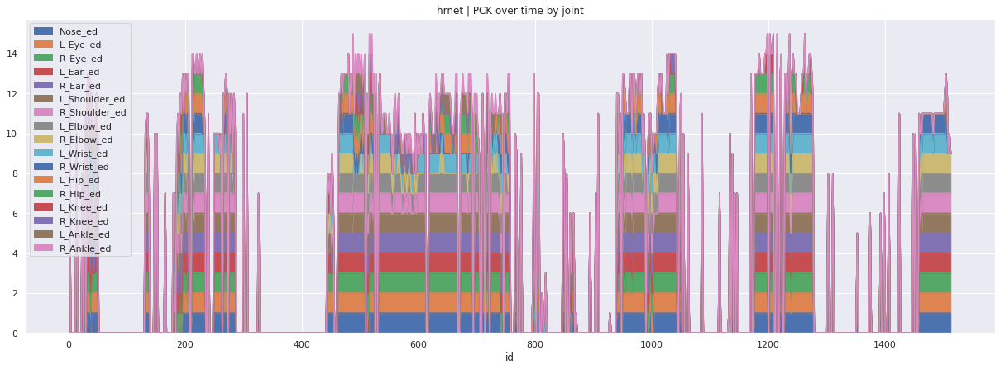

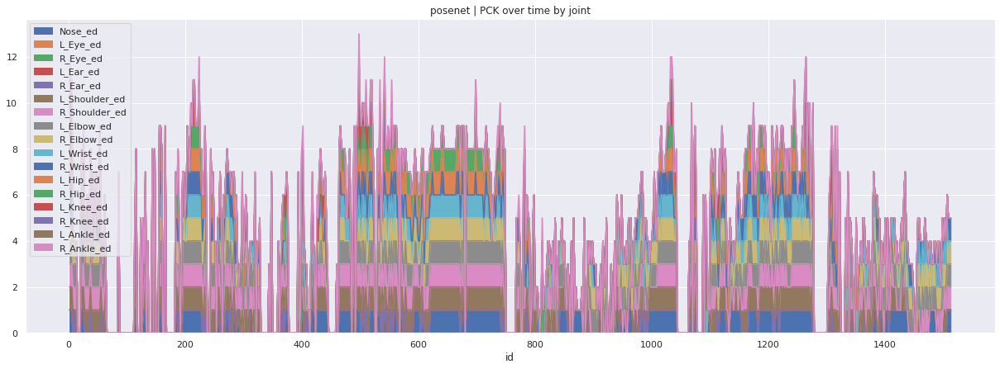

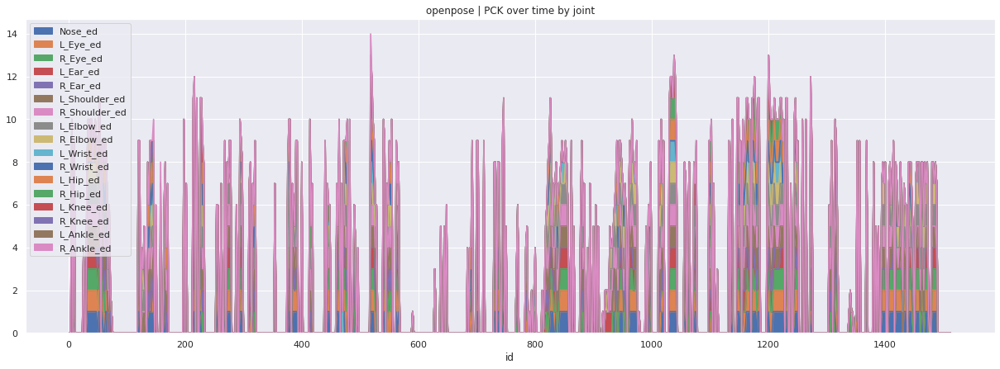

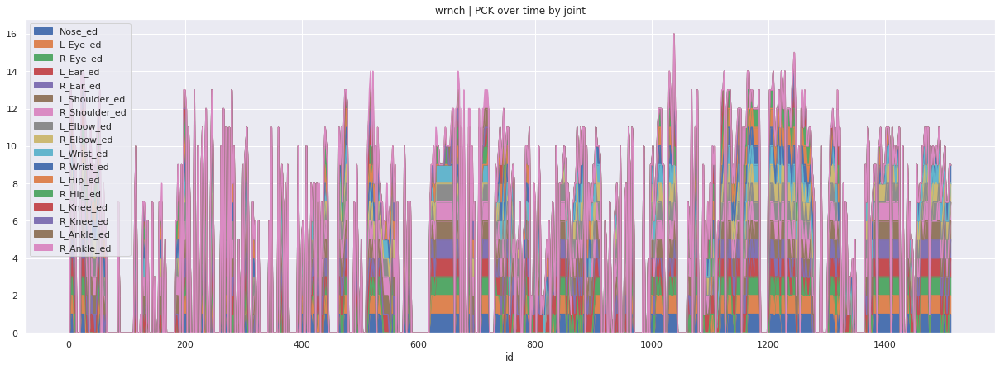

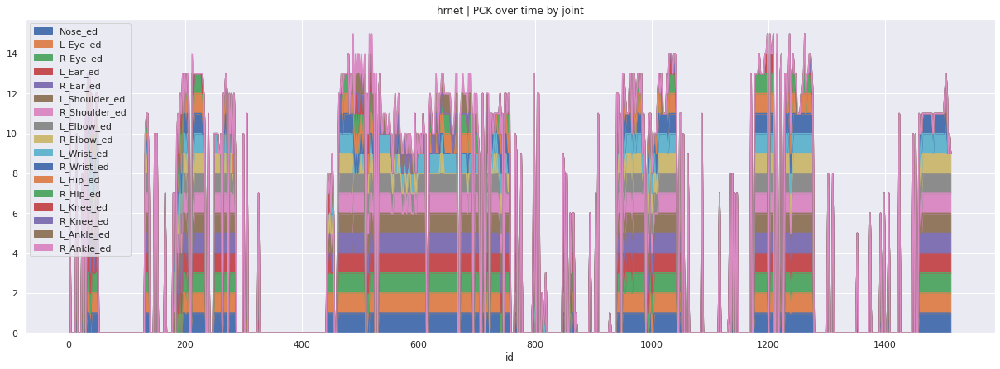

...

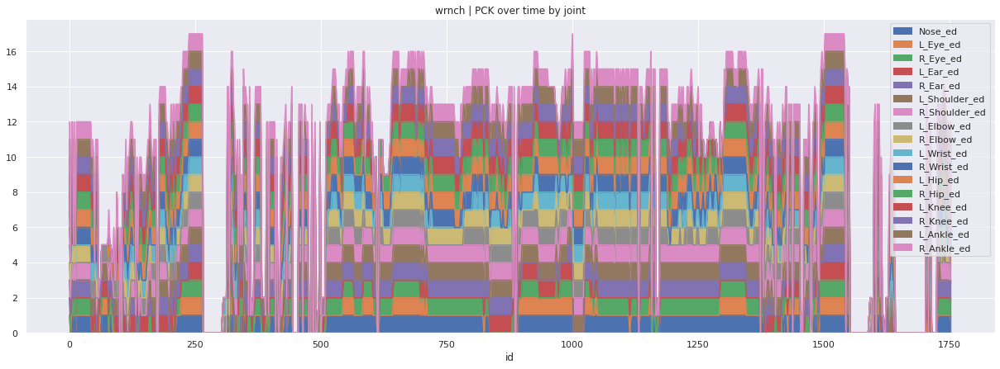

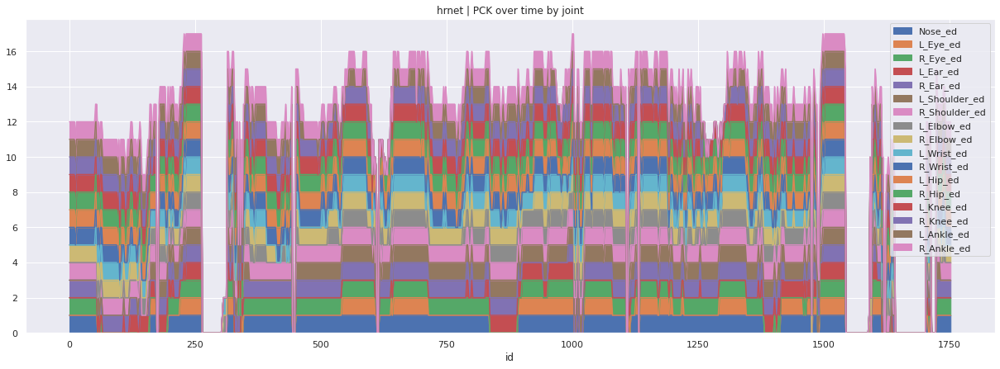

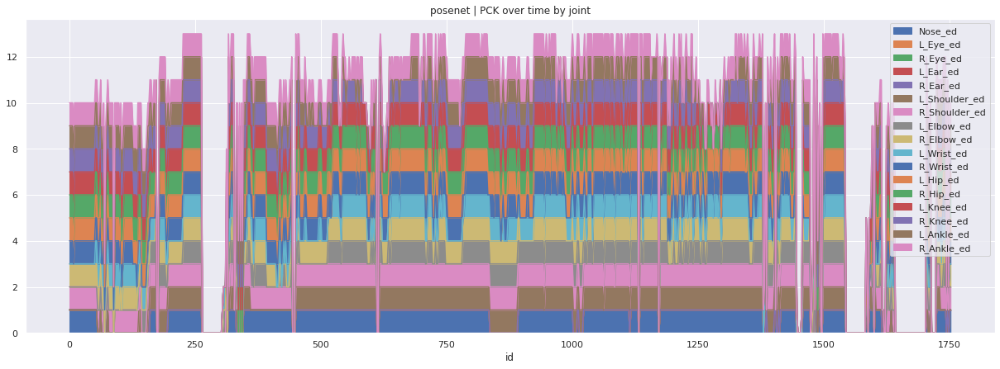

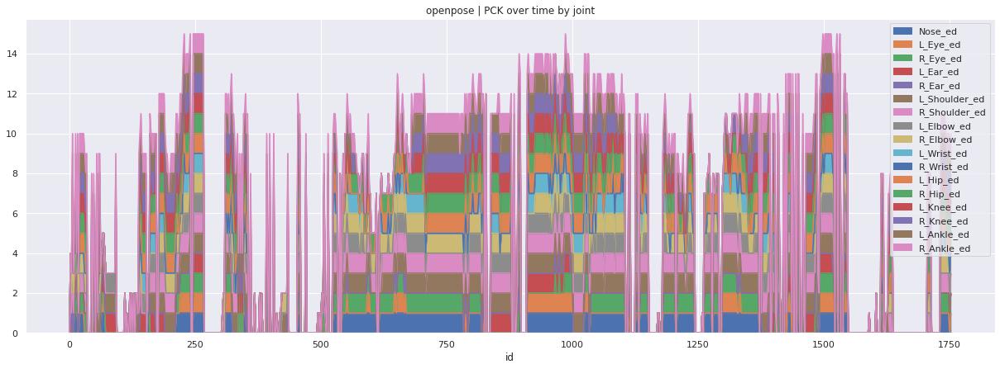

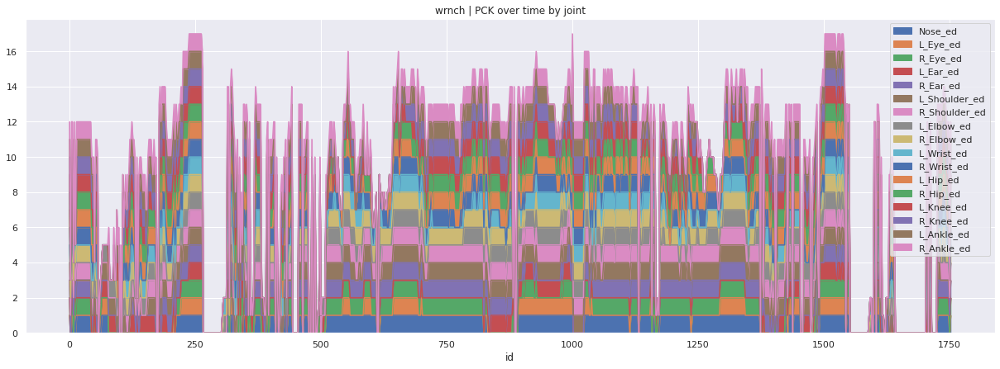

In [35]:
files = ['BAR-S_water_ballon', 
          'MEMIC_profile_view_lab_coat_legs_missing_1', 
          'AFG_subject_switching_close_nurses_subjects1',
        'MERCER_box_slamming1']

thresholds = [0, .1, .4, .6]
summaries = {}
for file in files:
    multiple_subjects = False
    gt_df = get_gt_df(file, multiple_subjects)
    shape = get_size(gt_df, file)
    height, width = shape[:2]
    hrnet_df, posenet_df, openpose_df, wrnch_df = get_hrnet_posenet_wrnch_dfs(file, width, height)
    for t in thresholds:
        summary = pck_calc(gt_df, [hrnet_df, posenet_df, openpose_df, wrnch_df], ["hrnet", "posenet", "openpose", "wrnch"], threshold=t)
        if (not (file in summaries)):
            summaries[file] = {}
            
        summaries[file][t] = summary
        

    

In [36]:
summaries

{'BAR-S_water_ballon': {0: {'hrnet': [0.49603174603174605, 0.6483137254901961],
   'posenet': [0.8002645502645502, 0.3501215362177929],
   'openpose': [0.4470899470899471, 0.43978419770274974],
   'wrnch': [0.6335978835978836, 0.5305170084735356]},
  0.1: {'hrnet': [0.49603174603174605, 0.6828984543792588],
   'posenet': [0.794973544973545, 0.46013055164469474],
   'openpose': [0.4444444444444444, 0.5866312741312741],
   'wrnch': [0.6322751322751323, 0.6204272753877671]},
  0.4: {'hrnet': [0.4894179894179894, 0.7703615415176798],
   'posenet': [0.794973544973545, 0.46013055164469474],
   'openpose': [0.4074074074074074, 0.7177293934681181],
   'wrnch': [0.6296296296296297, 0.7220069345298796]},
  0.6: {'hrnet': [0.4880952380952381, 0.8732754215636178],
   'posenet': [0.794973544973545, 0.46013055164469474],
   'openpose': [0.36243386243386244, 0.7871866295264623],
   'wrnch': [0.6164021164021164, 0.7950403346280251]}},
 'MEMIC_profile_view_lab_coat_legs_missing_1': {0: {'hrnet': [0.926

[0.5392724330395108, 0.5560015560544783, 0.6194369956895772, 0.6744271295316486]
[0.4023152188538638, 0.5266743449565633, 0.5266743449565633, 0.5266743449565633]
[0.4250037458955249, 0.5419366013745381, 0.6328248905890091, 0.7044781719952702]
[0.4983219697421958, 0.6127724066816074, 0.692023437062635, 0.7572586260922338]


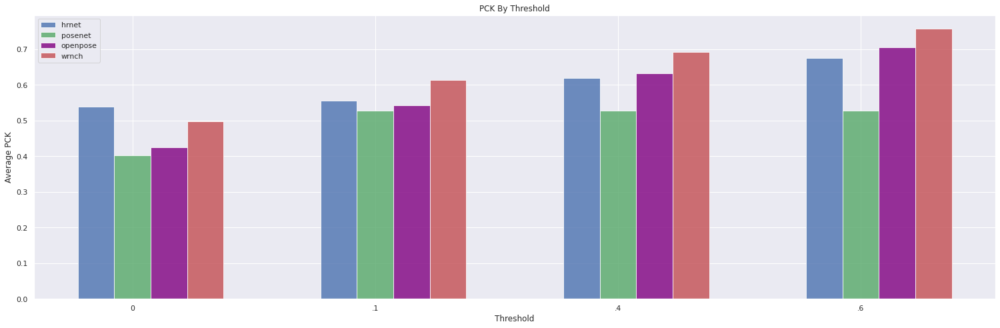

In [39]:
import matplotlib.pyplot as plt
import numpy as np

thresholds = [0, .1, .4, .6]
n_groups = len(thresholds)

# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.15
opacity = 0.8
colors = ['b', 'g', 'purple', 'r']
i = 0
for model in ['hrnet', 'posenet', 'openpose', 'wrnch']:
    array = []
    for t in thresholds:
        avg = 0
        for key in summaries:
            avg += summaries[key][t][model][1]
       
        array.append(avg/4)
    print(array)
    rects1 = plt.bar(index, array, bar_width,
    alpha=opacity,
    color=colors[i],
    label=model)
    index = index + bar_width
    i += 1
plt.xlabel('Threshold')
plt.ylabel('Average PCK')
plt.title('PCK By Threshold')
plt.xticks(np.arange(n_groups) + bar_width, ('0', '.1', '.4', '.6'))
plt.legend()

plt.tight_layout()
plt.show()